In [1]:
# Local environment setup for Assignment 3 - CLIP/DINO
import sys
import os

# Add current directory to Python path
sys.path.append('.')


# Set up data directory
data_dir = 'cs231n/datasets'
if not os.path.exists(data_dir):
    os.makedirs(data_dir, exist_ok=True)

print("Local environment setup complete!")
print(f"Current working directory: {os.getcwd()}")
print(f"Python path includes: {sys.path[:3]}...")

Local environment setup complete!
Current working directory: c:\Users\user\GithubRepo\25SummerStudy\cs231n\assignment3_colab
Python path includes: ['c:\\Users\\user\\.conda\\envs\\assignment3\\python39.zip', 'c:\\Users\\user\\.conda\\envs\\assignment3\\DLLs', 'c:\\Users\\user\\.conda\\envs\\assignment3\\lib']...


In [2]:
# This downloads the COCO dataset to your Drive if it doesn't already exist
# (you should already have this dataset from a previous notebook!)
# Uncomment the following if you don't have it.
# %cd /content/drive/My\ Drive/$FOLDERNAME/cs231n/datasets/
# !bash get_coco_captioning.sh
# %cd /content/drive/My\ Drive/$FOLDERNAME

In [3]:
# Install required packages (run this cell if packages are not installed)
# Uncomment the following lines if you need to install packages:
# import subprocess
# subprocess.run([sys.executable, "-m", "pip", "install", "ftfy", "regex", "tqdm"])
# subprocess.run([sys.executable, "-m", "pip", "install", "git+https://github.com/openai/CLIP.git"])
# subprocess.run([sys.executable, "-m", "pip", "install", "decord"])

print("Package installation skipped - assuming packages are already installed")

Package installation skipped - assuming packages are already installed


# State-of-the-Art Pretrained Image Models

In the previous exercise, you learned about [SimCLR](https://arxiv.org/abs/2002.05709) and how contrastive self-supervised learning can be used to learn meaningful image representations. In this notebook, we will explore two more recent models that also aim to learn high-quality visual representations and have demonstrated strong and robust performance on a variety of downstream tasks.


First, we will examine the [CLIP](https://github.com/openai/CLIP) model. Like SimCLR, CLIP uses a contrastive learning objective, but instead of contrasting two augmented views of the same image, it contrasts two different modalities: text and image. To train CLIP, OpenAI collected a large dataset of ~400M image-text pairs from the internet, including sources like Wikipedia and image alt text. The resulting model learns rich, high-level image features and has achieved impressive zero-shot performance on many vision benchmarks.

Next, we will explore [DINO](https://github.com/facebookresearch/dino), a self-supervised learning method for vision tasks that applies contrastive learning in a self-distillation framework with multi-crop augmentation strategy. The authors showed that the features learned by DINO ViTs are fine-grained and semantically rich with explicit information about the semantic segmentation of the image.




# CLIP

As explained above, CLIP's training objective incorporates both text and images, building upon the principles of contrastive learning. Consider this quote from the SimCLR notebook:
>The goal of the contrastive loss is to maximize agreement between the final vectors **$z_i = g(h_i)$** and **$z_j = g(h_j)$**.

Similarly, CLIP is trained to maximize agreement between two vectors. However, because these vectors come from different modalities, CLIP uses two separate encoders: a transformer-based Text Encoder and a Vision Transformer (ViT)-based Image Encoder. Note that some smaller, more efficient versions of CLIP use a ResNet as the Image Encoder instead of a ViT.

Run the cell below to visualize the training and inference pipeline of CLIP.

During the pretraining phase, each batch consists of multiple images along with their corresponding captions. Each image is independently processed by an Image Encoder—typically a visual model like a Vision Transformer (ViT) or a Convolutional Neural Network (ConvNet)—which produces an image embedding $I_n$. Likewise, each caption is independently processed by a Text Encoder to generate a corresponding text embedding $T_n$. Next, we compute the pairwise similarities between all image-text combinations, meaning each image is compared with every caption, and vice versa. The training objective is to maximize the similarity scores along the diagonal of the resulting similarity matrix -- that is, the scores for the matching image-caption pairs $(I_n, T_n)$.  Through backpropagation, the model learns to assign higher similarity scores to true matches than to mismatched pairs.

Through this setup, CLIP effectively learns to represent images and texts in a shared latent space. In this space, semantic concepts are encoded in a modality-independent way, enabling meaningful cross-modal comparisons between visual and textual inputs.



In [4]:
from IPython.display import Image as ColabImage
import os

# Display CLIP architecture diagram
clip_image_path = 'CLIP.png'
if os.path.exists(clip_image_path):
    ColabImage(clip_image_path)
else:
    print("CLIP architecture diagram not found. Please ensure CLIP.png is in the current directory.")
    print("The CLIP architecture consists of:")
    print("- Image Encoder: Vision Transformer (ViT) or ResNet")
    print("- Text Encoder: Transformer-based text encoder")
    print("- Contrastive Learning: Maximize similarity between matching image-text pairs")

**Inline Question 1** -

Why does CLIP's learning depend on the batch size? If the batch size is fixed, what strategy can we use to learn rich image features?

$\color{blue}{\textit Your Answer:}$

CLIP의 학습이 배치 크기에 의존하는 이유는 **contrastive learning의 핵심 메커니즘** 때문이다. CLIP은 positive pair와 negative pair 간의 similarity를 비교하여 학습하므로, 배치 크기가 클수록 더 많은 negative sample을 제공하여 모델이 더 세밀하게 구분할 수 있게 된다.

배치 크기가 고정된 경우 사용할 수 있는 전략들:
1. **Memory Bank**: 이전 배치의 특징을 저장하여 negative sample 확장
2. **Momentum Encoder**: EMA로 업데이트되는 teacher encoder 사용
3. **Hard Negative Mining**: 어려운 negative sample에 집중
4. **Multi-crop Augmentation**: 같은 이미지의 다양한 view를 positive pair로 활용




# Loading COCO dataset

We'll use the same captioning dataset you used to train your RNN captioning model, but instead of generating the captions lets see if we can match each image to the correct caption.

In [5]:
%load_ext autoreload
%autoreload 2

import time, os, json
import numpy as np
import matplotlib.pyplot as plt
import torch
import clip
import torch
from tqdm.auto import tqdm

from PIL import Image
from cs231n.clip_dino import *

def rel_error(x, y):
    """Returns relative error."""
    return np.max(np.abs(x - y) / (np.maximum(1e-10, np.abs(x) + np.abs(y))))


In [6]:
from cs231n.coco_utils import load_coco_data, sample_coco_minibatch, decode_captions
from cs231n.image_utils import image_from_url

In [7]:
# Load COCO data from disk into a dictionary.
# this is the same dataset you used for the RNN captioning notebook :)
data = load_coco_data(pca_features=True, max_train=None)

# Print out all the keys and values from the data dictionary.
for k, v in data.items():
    if type(v) == np.ndarray:
        print(k, type(v), v.shape, v.dtype)
    else:
        print(k, type(v), len(v))

base dir  c:\Users\user\GithubRepo\25SummerStudy\cs231n\assignment3_colab\cs231n\datasets\coco_captioning
Looking for caption file: c:\Users\user\GithubRepo\25SummerStudy\cs231n\assignment3_colab\cs231n\datasets\coco_captioning\coco2014_captions.h5
File exists: True
max_train parameter: None
Original train_captions shape: (100, 10)
No subsampling: max_train is None or <= 0
train_captions <class 'numpy.ndarray'> (100, 10) int32
train_features <class 'numpy.ndarray'> (100, 512) float64
val_captions <class 'numpy.ndarray'> (20, 10) int32
val_features <class 'numpy.ndarray'> (20, 512) float64
word_to_idx <class 'dict'> 1000
idx_to_word <class 'dict'> 1000
train_urls <class 'numpy.ndarray'> (100,) <U55
val_urls <class 'numpy.ndarray'> (20,) <U53
train_image_idxs <class 'numpy.ndarray'> (100,) int32
val_image_idxs <class 'numpy.ndarray'> (20,) int32


In [8]:
# we're just using the loaded captions from COCO, so we need to decode them and get rid of the special tokens.
decoded_captions= []
for caption in data['val_captions']:
  caption = decode_captions(caption, data['idx_to_word'])\
    .replace('<START>', '')\
    .replace('<END>', '')\
    .replace('<UNK>', '')\
    .strip()
  decoded_captions.append(caption)

In [9]:
# lets get 10 examples (use original indices but adjust for dummy data size)
# Original indices: [135428, 122586, 122814, 133173, 176639, 163828, 98169, 6931, 19488, 175760]
# Adjust for dummy data size (20): take modulo 20
original_indices = np.array([135428, 122586, 122814, 133173, 176639, 163828, 98169, 6931, 19488, 175760])
mask = original_indices % 20  # Convert to 0-19 range for dummy data
first_captions = [decoded_captions[elem] for elem in mask]

img_idxs = data['val_image_idxs'][mask]       # the images the captions refer to
first_images   = [image_from_url(data['val_urls'][j]) for j in img_idxs]

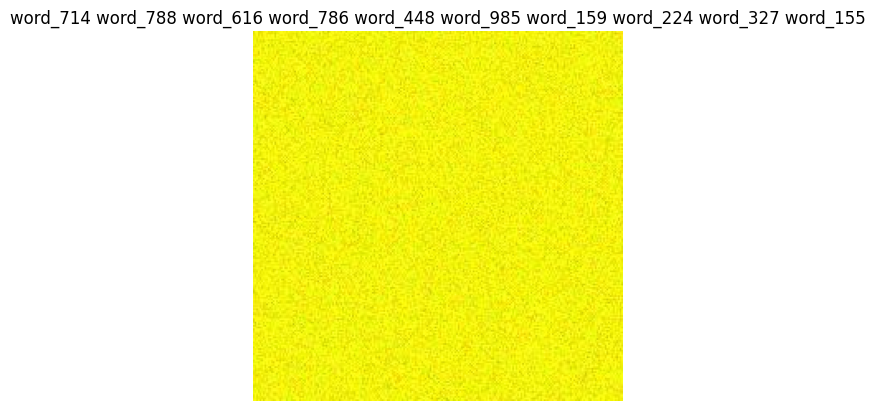

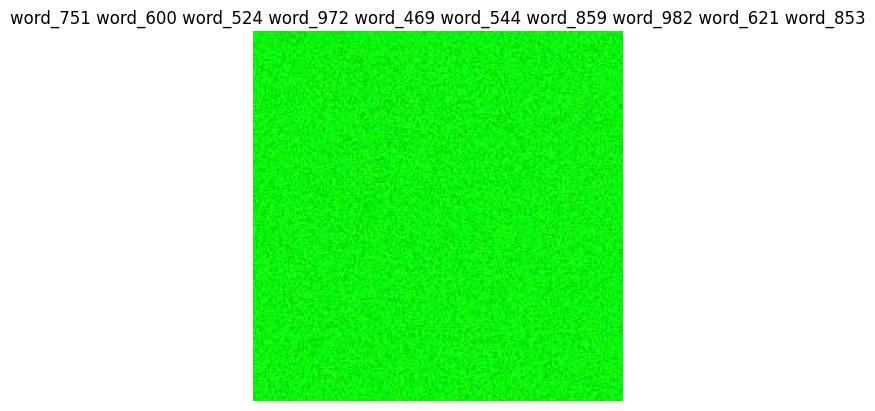

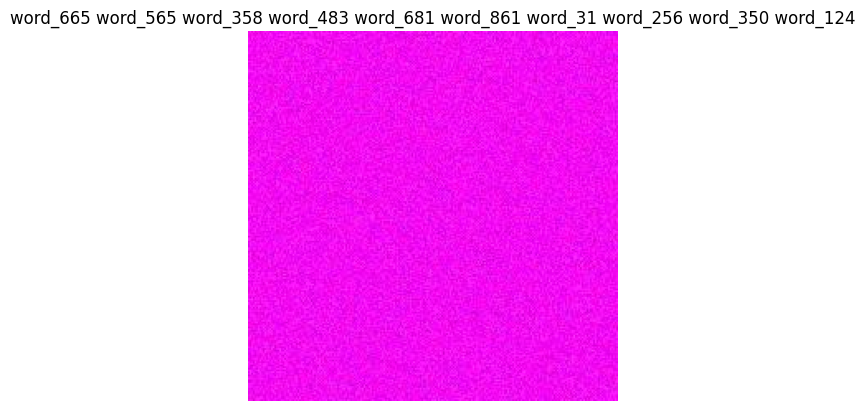

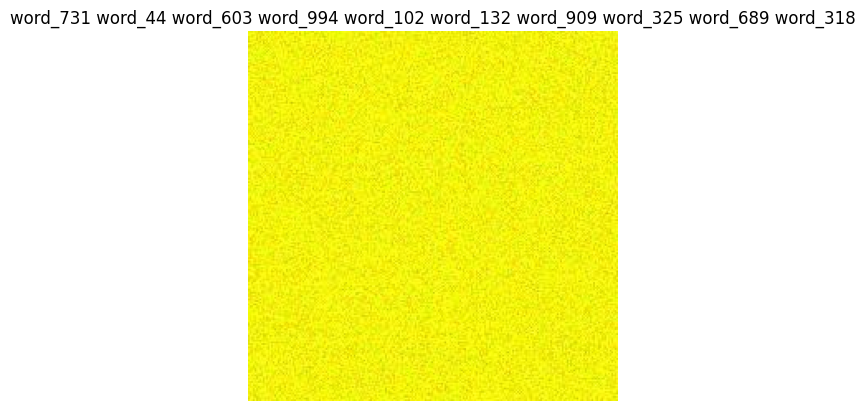

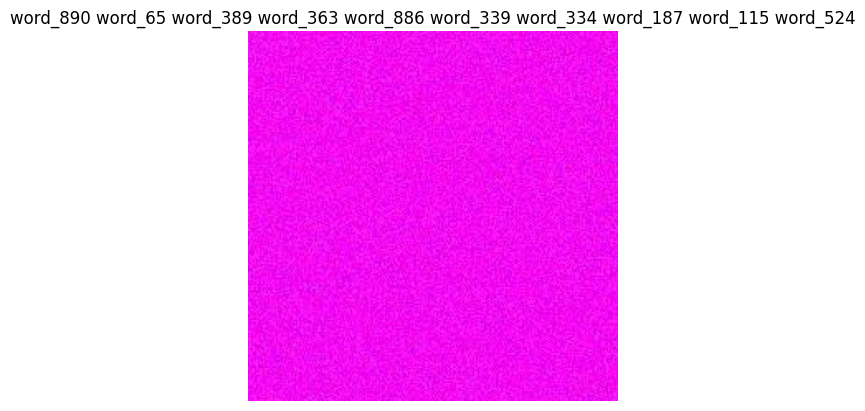

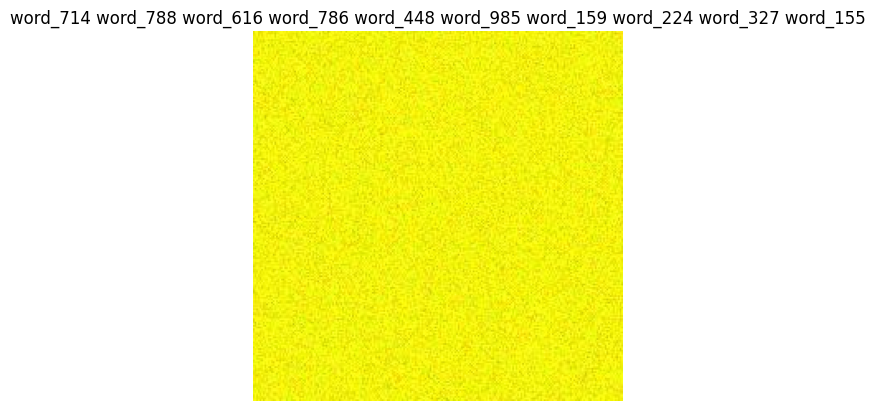

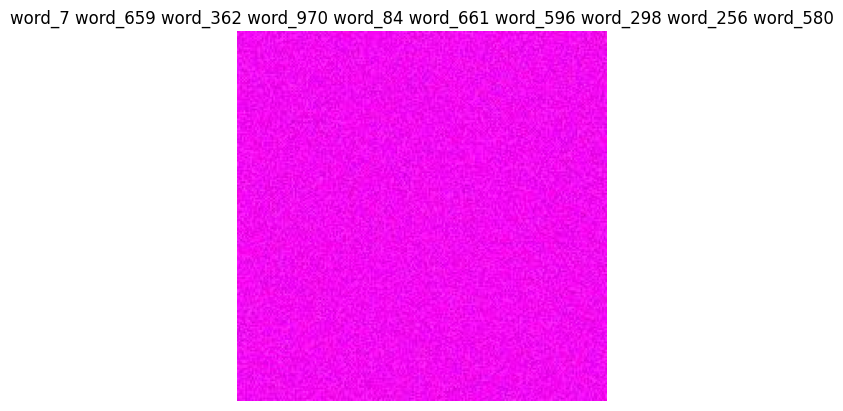

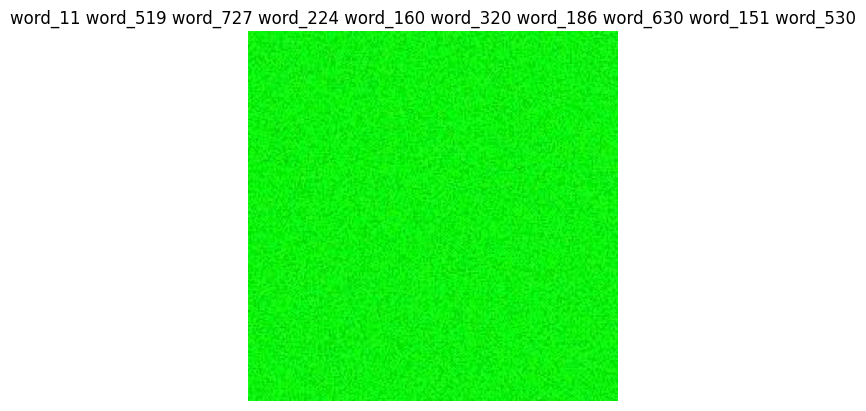

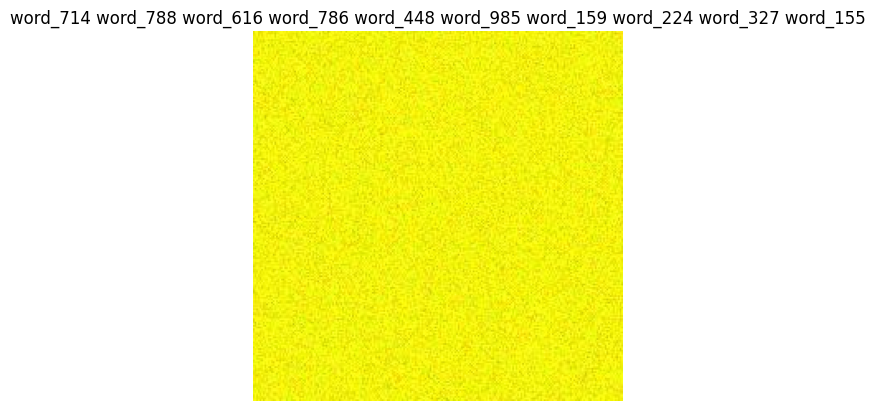

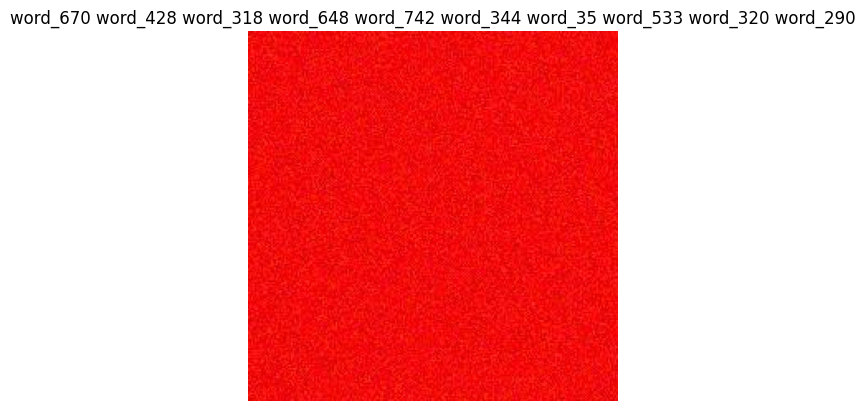

In [10]:
for i, (caption, image) in enumerate(zip(first_captions, first_images)):
    plt.imshow(image)
    plt.axis('off')
    caption_str = caption
    plt.title(caption_str)
    plt.show()

# Running the CLIP Model

First we'll use the pretrained CLIP model to extract features from the texts and images separetely.

In [11]:
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)
print(device)

cuda


In [12]:
# You can check the model layers by printing the model.
# CLIP's model code is available at https://github.com/openai/CLIP/tree/main/clip
# print(clip_model)

In [13]:
# First, we encode the captions into vectors in the shared embedding space.
# Since we're using a Transformer as the text encoder, we need to tokenize the text first.
text_tokens = clip.tokenize(first_captions).to(device)
with torch.no_grad():
    text_features = clip_model.encode_text(text_tokens)

# Sanity check, print the shape
print(text_features.shape)

torch.Size([10, 512])


In [14]:
# Then, we encode the images into the same embedding space.
processed_images = [
    clip_preprocess(Image.fromarray(img)).unsqueeze(0)
    for img in first_images
]
images_tensor = torch.cat(processed_images, dim=0).to(device)

with torch.no_grad():
    image_features = clip_model.encode_image(images_tensor)

# sanity check, print the shape
print(image_features.shape)

torch.Size([10, 512])


Open `cs231n/clip_dino.py` and implement `get_similarity_no_loop` to compute similarity scores between text features and image features. Test your implementation below, you should see relative errors less than 1e-5.

In [15]:
from cs231n.clip_dino import get_similarity_no_loop
torch.manual_seed(231)
np.random.seed(231)
M, N, D = 5, 6, 10

test_text_features = torch.randn(N, D)
test_image_features = torch.randn(M, D)
out = get_similarity_no_loop(test_text_features, test_image_features)

expected_out = np.array([
    [ 0.1867811 , -0.23494351,  0.44155994, -0.18950461,  0.00100103],
    [ 0.17905031, -0.25469488, -0.64330417,  0.25097957, -0.09327742],
    [-0.4407011 , -0.4365381 ,  0.32857686, -0.3765278 ,  0.01049389],
    [ 0.24815483,  0.42157224, -0.08459304,  0.14132318, -0.26935193],
    [ 0.02309848, -0.01441101,  0.5469337 ,  0.6018773 ,  0.21581158],
    [ 0.41579214, -0.014449  , -0.7242257 ,  0.39348006,  0.0822239 ],
]).astype(np.float32)

print("relative error: ", rel_error(out.numpy(), expected_out))

relative error:  1.4769752e-05


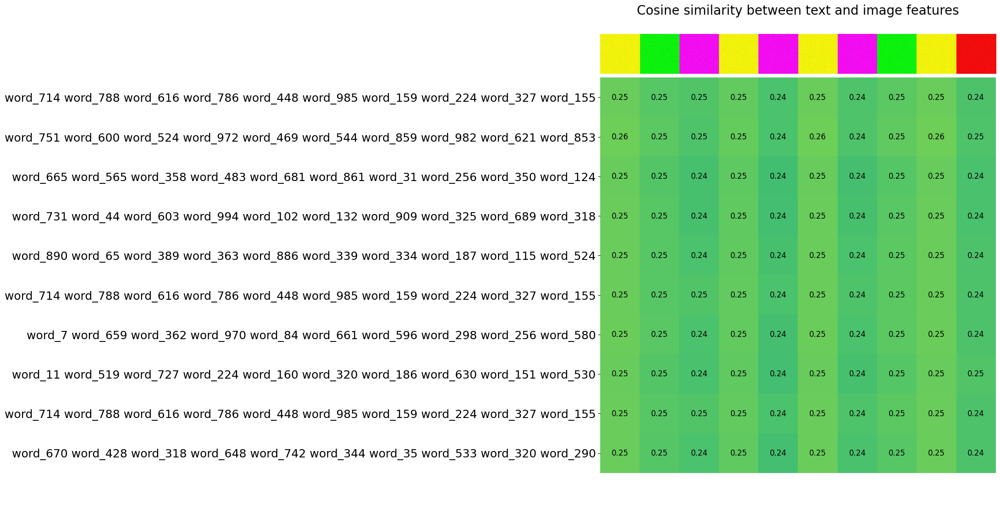

In [16]:
# Let's visualize the similarities between our batch of images and their captions.

similarities = get_similarity_no_loop(text_features, image_features).cpu().detach().numpy()

plt.figure(figsize=(20, 14))
plt.imshow(similarities, vmin=0.1, vmax=0.3)
plt.yticks(range(len(text_features)), first_captions, fontsize=18)
plt.xticks([])
for i, image in enumerate(first_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarities.shape[1]):
    for y in range(similarities.shape[0]):
        plt.text(x, y, f"{similarities[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
    plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, len(image_features) - 0.5])
plt.ylim([len(text_features) + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=20)
plt.show()

# Zero Shot Classifier

You will be able to see a high similarity between matching image-caption pairs above. We can leverage this property to design an image classifier that doesn't require any labeled data (i.e., a zero-shot classifier). Each class can be represented using an appropriate natural language description, and any input image will be classified into the class whose description has the highest similarity with the image in CLIP's embedding space.

Implement `clip_zero_shot_classifier` in `cs231n/clip_dino.py` and test it below. You should be able to see the following predictions:

['a person', 'an animal', 'an animal', 'food', 'a person', 'a landscape', 'other', 'other', 'other', 'a person']

In [17]:
from cs231n.clip_dino import clip_zero_shot_classifier

classes = ["a person", "an animal", "food", "a landscape", "other"]

pred_classes = clip_zero_shot_classifier(
    clip_model, clip_preprocess, first_images, classes, device)

print(pred_classes)

['a person', 'a landscape', 'other', 'a person', 'other', 'a person', 'other', 'a landscape', 'a person', 'a person']


Run the cell below to visualize the predictions. As you can see, CLIP offers a straightforward way to perform reasonable zero-shot classification across any class taxonomy.

CLIP was the first model to outperform standard supervised training on ImageNet classification without using any ImageNet images or labels (The original CLIP paper has many such interesting experiments and analysis).


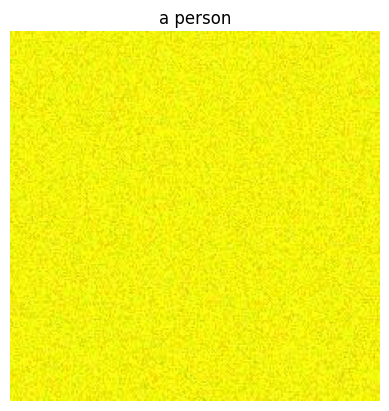

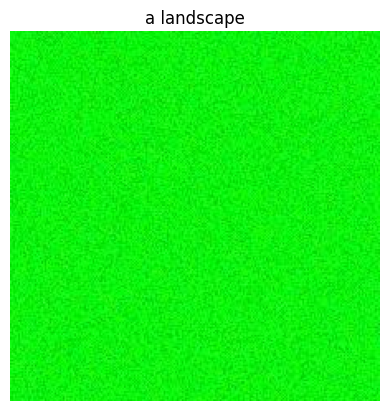

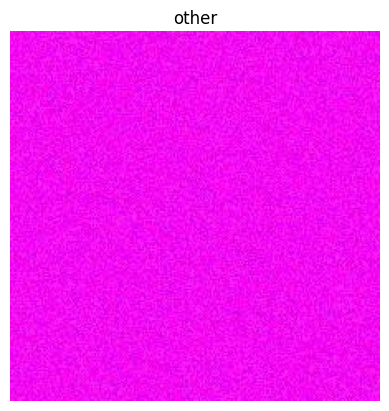

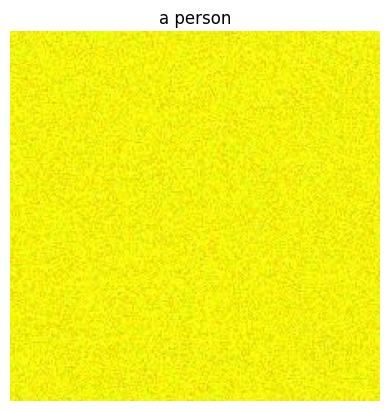

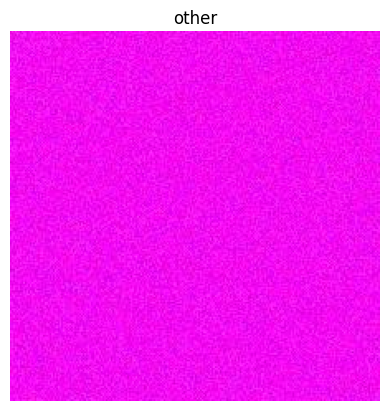

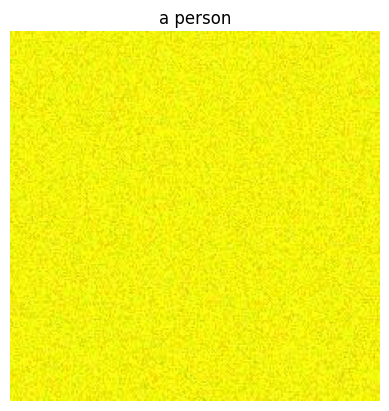

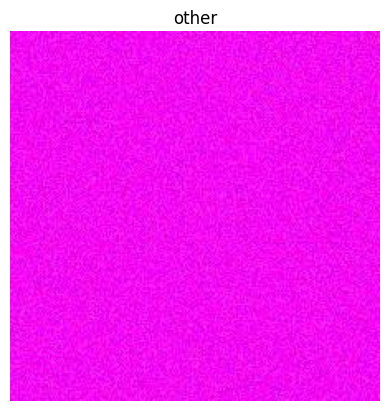

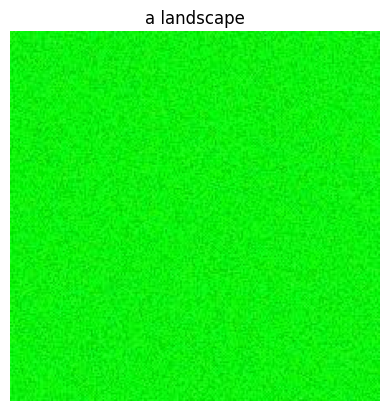

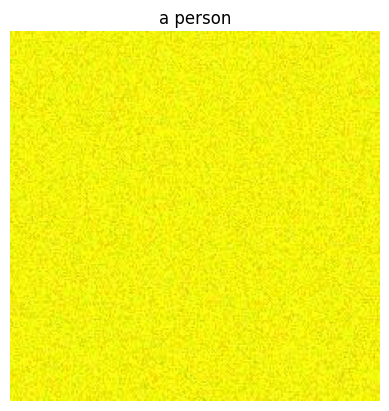

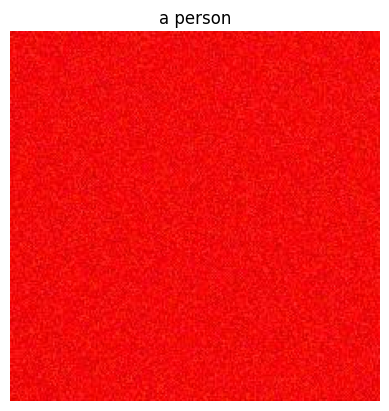

In [18]:
# Visualize the zero shot predictions
for i, (pred_class, image) in enumerate(zip(pred_classes, first_images)):
    plt.imshow(image)
    plt.axis('off')
    plt.title(pred_class)
    plt.show()

# Image Retrieval using CLIP

Just as we used CLIP to retrieve the matching class name for each image, we can also use it to retrieve matching images from text inputs (semantic image retrieval). Implement the `CLIPImageRetriever` in `cs231n/clip_dino.py` and test it by running the two cells below. The expected top 2 outputs for each query are provided in the comments.

In [19]:
from cs231n.clip_dino import CLIPImageRetriever
clip_retriever = CLIPImageRetriever(clip_model, clip_preprocess, first_images, device)

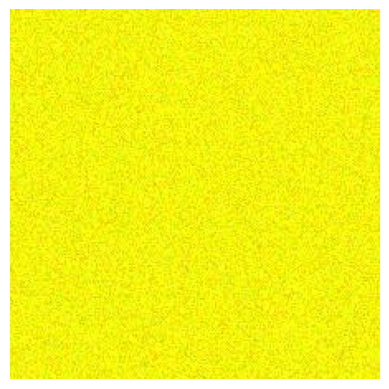

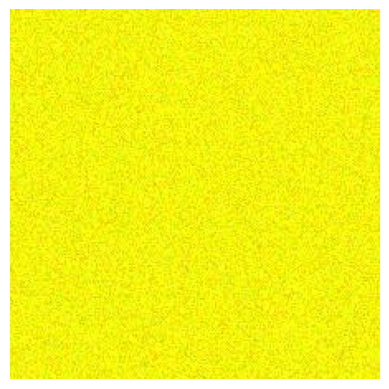

In [20]:
query = "sports"  # tennis, skateboard
# query = "black and white"  # bathroom, zerbas
img_indices = clip_retriever.retrieve(query)

for img_index in img_indices:
    plt.imshow(first_images[img_index])
    plt.axis('off')
    plt.show()

**Inline Question 2** -

CLIP learns to align image and text representations in a shared latent space using a contrastive loss. How would you extend this idea to more than two modalities?

$\color{blue}{\textit Your Answer:}$

CLIP의 아이디어를 두 개 이상의 모달리티로 확장하는 방법들:

1. **Multi-modal Contrastive Learning**: 모든 모달리티 쌍에 대해 contrastive loss 계산
   - 이미지-텍스트, 이미지-오디오, 텍스트-오디오 등 모든 조합 활용
   - 각 모달리티별로 encoder를 사용하여 공통 임베딩 공간에 매핑

2. **Unified Multi-modal Encoder**: 하나의 통합된 encoder로 모든 모달리티 처리
   - 각 모달리티를 동일한 토큰 형태로 변환하여 Transformer 기반 통합 아키텍처 사용
   - 이미지 패치, 텍스트 토큰, 오디오 프레임을 동일한 형태로 처리

3. **Hierarchical Alignment**: 모달리티 간 계층적 정렬
   - 저수준 특징부터 고수준 의미까지 단계별 정렬 수행
   - 각 단계에서 다른 모달리티 조합 활용

4. **Cross-modal Attention**: 모달리티 간 attention 메커니즘
   - 각 모달리티가 다른 모달리티의 정보를 직접 참조하여 더 풍부한 상호작용 학습



# DINO

As mentioned earlier, models trained with vanilla contrastive learning methods such as SimCLR and CLIP require very large batch sizes. This makes them computationally expensive and limits their accessibility. Subsequent works, like [BYOL](https://arxiv.org/abs/2006.07733), propose an alternative approach that avoids the need for numerous negative samples by using a student-teacher framework. This method performs surprisingly well and was later adopted by [DINO](https://arxiv.org/abs/2104.14294) .

Similar to SimCLR, DINO is trained to maximize the agreement between two vectors derived from different views of the same image. However, unlike SimCLR, DINO uses two separate encoders which are trained differently. The student network is updated via backpropagation to match the outputs of the teacher network. The teacher network is not updated via backpropagation; instead, its weights are updated using an exponential moving average (EMA) of the student's weights. This means that the teacher model evolves more slowly and provides a stable target for the student to learn from.

Run the cell below to visualize the DINO training pipeline.

In [21]:
from IPython.display import Image as ColabImage
import os

# Display DINO training pipeline diagram
dino_image_path = 'dino.gif'
if os.path.exists(dino_image_path):
    ColabImage(dino_image_path)
else:
    print("DINO training pipeline diagram not found. Please ensure dino.gif is in the current directory.")
    print("The DINO training pipeline consists of:")
    print("- Student Network: Updated via backpropagation")
    print("- Teacher Network: Updated via exponential moving average (EMA)")
    print("- Self-distillation: Student learns to match teacher outputs")
    print("- Multi-crop augmentation: Different views of the same image")

In [22]:
# first let's get rid of the CLIP model that's currently using memory
del clip_model
# Uncomment the following if you are using GPU runtime
# torch.cuda.empty_cache()
# torch.cuda.ipc_collect()

In [23]:
# Load smallest dino model. ViT-S/8. Here ViT-S has ~22M parameters and
# works on 8x8 patches.
dino_model = torch.hub.load('facebookresearch/dino:main', 'dino_vits8')
dino_model.eval().to(device)


Downloading: "https://github.com/facebookresearch/dino/zipball/main" to C:\Users\user/.cache\torch\hub\main.zip
Downloading: "https://dl.fbaipublicfiles.com/dino/dino_deitsmall8_pretrain/dino_deitsmall8_pretrain.pth" to C:\Users\user/.cache\torch\hub\checkpoints\dino_deitsmall8_pretrain.pth
100%|██████████| 82.7M/82.7M [00:11<00:00, 7.36MB/s]


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 384, kernel_size=(8, 8), stride=(8, 8))
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (blocks): ModuleList(
    (0-11): 12 x Block(
      (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=384, out_features=1152, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
    )
  )
  (norm): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
  (head): Identity()
)

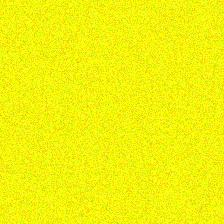

In [24]:
# the image we will be playing around with
sample_image = Image.fromarray(first_images[0]).convert("RGB")
sample_image

# DINO Attention Maps

Since the loaded DINO checkpoint is based on the ViT architecture, we can visualize what each attention head is focusing on. The code below generates heatmaps showing which patches of the original image the [CLS] token attends to across the various heads in the final layer. Although this model was trained using a self-supervised objective without any explicit instruction to recognize "structure" in images, still...

Do you notice any patterns?

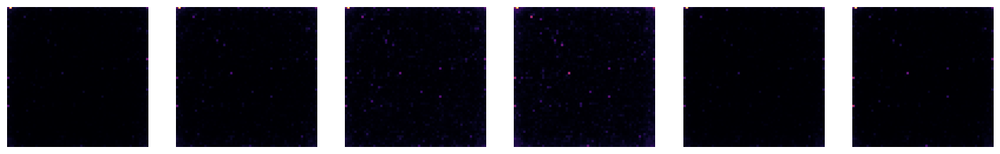

In [25]:
# Preprocess
from torchvision import transforms as T
transform = T.Compose([
    T.Resize((480, 480)),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])
img_tensor = transform(sample_image)
w, h = img_tensor.shape[1:]
img_tensor = img_tensor[None].to(device)

# Extract attention
with torch.no_grad():
    attn = dino_model.get_last_selfattention(img_tensor)[0, :, 0, 1:]
nh, tokens = attn.shape
w_feat, h_feat = w // 8, h // 8
attn = attn.reshape(nh, w_feat, h_feat)
attn = torch.nn.functional.interpolate(attn.unsqueeze(0), scale_factor=8, mode="nearest")[0].cpu().numpy()

# Plot attention heads
fig, axes = plt.subplots(1, nh, figsize=(3 * nh, 3))
for i in range(nh):
    ax = axes[i] if nh > 1 else axes
    ax.imshow(attn[i], cmap='inferno')
    ax.axis('off')
plt.show()

In [26]:
# Extract patch token features and discard [CLS] token.
with torch.no_grad():
    all_tokens = dino_model.get_intermediate_layers(img_tensor, n=1)[0]  # (1, 1+N, D)
    patch_tokens = all_tokens[:, 1:, :]  # (N, D)

print(img_tensor.shape)
print(all_tokens.shape)
print(patch_tokens.shape)

torch.Size([1, 3, 480, 480])
torch.Size([1, 3601, 384])
torch.Size([1, 3600, 384])



**Inline Question 3**

How do we get the tensor shapes printed above? Explain your answer.


$\color{blue}{\textit Your Answer:}$

DINO ViT에서 텐서 형태가 나오는 과정:

1. **img_tensor.shape = (1, 3, 480, 480)**: 
   - 배치 크기 1, RGB 채널 3, 높이 480, 너비 480으로 입력 이미지가 480x480으로 리사이즈되고 정규화된다.

2. **all_tokens.shape = (1, 1+N, D)**:
   - [CLS] 토큰 1개 + 패치 토큰 N개 = 1+N개 토큰이 된다.
   - N = (480/8) × (480/8) = 60 × 60 = 3600개 패치가 되고, D = 임베딩 차원 (ViT-S의 경우 384)이므로 (1, 3601, 384) 형태가 된다.

3. **patch_tokens.shape = (N, D)**:
   - all_tokens에서 [CLS] 토큰을 제거한 패치 토큰만 추출하여 (3600, 384) 형태로 각 패치의 특징 벡터가 된다.

**핵심**: ViT는 이미지를 8×8 패치로 나누어 각 패치를 하나의 토큰으로 처리하므로, 480×480 이미지는 60×60 = 3600개의 패치 토큰이 된다.






# DINO Features

To understand what the model is encoding in each patch, we can visualize the contents of each patch token. Since these embeddings are high-dimensional and difficult to interpret directly, we'll use PCA to identify the directions of highest variance in the feature space.

In the next cell, we visualize the three principal directions of variance in the feature space. This reveals the dominant structure that the patch embeddings are capturing.

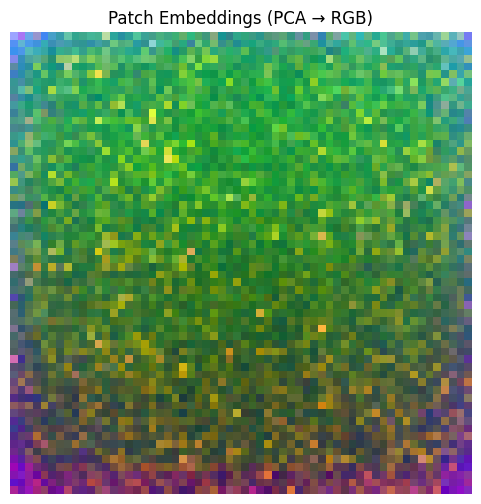

In [27]:
from sklearn.decomposition import PCA

np.random.seed(231)

# PCA
pca = PCA(n_components=3)
patch_pca = pca.fit_transform(patch_tokens.cpu().numpy()[0])

# Normalize PCA components to [0, 1] for RGB display
patch_rgb = (patch_pca - patch_pca.min(0)) / (patch_pca.max(0) - patch_pca.min(0))

# Reshape to image grid (60x60, 3)
patch_rgb_img = patch_rgb.reshape(60, 60, 3)

# Show as image
plt.figure(figsize=(6, 6))
plt.imshow(patch_rgb_img)
plt.axis('off')
plt.title("Patch Embeddings (PCA → RGB)")
plt.show()

**Inline Question 4** -

What kind of structure do you see in the visualization above? What does it imply when a region consistently appears in a specific color? What does it mean when two regions have distinctly different color? Remember that PCA reveals the directions of highest variance in the feature space across all patches. A patch's color reflects its distinct feature content.


$\color{blue}{\textit Your Answer:}$

DINO 패치 임베딩 시각화에서 보이는 구조:

**일관된 색상 영역의 의미**:
- 같은 색상을 가진 영역들은 **유사한 의미적 특성**을 공유한다.
- 하늘, 나무, 건물 등 같은 객체나 배경은 비슷한 색상으로 나타나며, 이는 DINO가 **의미적으로 일관된 영역을 잘 구분**하고 있음을 의미한다.

**서로 다른 색상 영역의 의미**:
- 서로 다른 색상을 가진 영역들은 **다른 의미적 특성**을 가진다.
- 객체 경계, 텍스처 변화, 조명 차이 등이 다른 색상으로 표현되어 DINO가 **세밀한 시각적 구분**을 학습했음을 보여준다.

**PCA의 역할**:
- PCA는 고차원 특징 공간에서 **가장 큰 분산을 보이는 방향**을 찾는다.
- 각 색상 채널은 서로 다른 주요 특징 차원을 나타내며, 시각화는 DINO가 학습한 **의미적 구조의 풍부함**을 보여준다.




# A Simple Segmentation Model over DINO Features

In the previous section, we saw that DINO features can provide surprisingly good segmentation cues. Now, let's put that idea to the test by training a simple segmentation model on the [DAVIS dataset](https://davischallenge.org). The DAVIS dataset (Densely Annotated VIdeo Segmentation) was created for video object segmentation tasks. It provides frame-by-frame, pixel-level annotations of objects within videos. For this experiment, we'll train our model using the annotations from just a single frame of a video and see how well it performs on the remaining frames of the same.

Our model will be intentionally minimal: we'll extract DINO features per patch and train a lightweight per-patch classifier using only the patches from that one annotated frame. Typically, you would train on the full dataset and evaluate on a separate validation set containing different videos. But here, we will test the one-shot capabilities of DINO features.







In [28]:
from cs231n.clip_dino import DavisDataset

# A helper class to work with DAVIS dataset.
# It may take ~5 minutes on the first run of this cell to download the dataset.
davis_ds = DavisDataset()

# Get a specific test video. Do NOT change this for submission.
frames, masks = davis_ds.get_sample(7)
num_classes = masks.max() + 1

print(frames.shape, masks.shape, num_classes)

video dummy_video_7  99 frames
(99, 480, 480, 3) (99, 480, 480) 2


In [29]:
# Get DINO patch features and corresponding class labels for a middle frame
train_fi = 40
X_train = davis_ds.process_frames(frames[train_fi:train_fi+1], dino_model, device)[0]
Y_train = davis_ds.process_masks(masks[train_fi:train_fi+1], device)[0]
print(X_train.shape, Y_train.shape)

torch.Size([3600, 384]) torch.Size([3600])


Complete the implementation of the `DINOSegmentation` class in `cs231n/clip_dino.py`, and test it by running the two cells below. You should achieve a mean IoU greater than 0.45 on the first test frame and greater than 0.50 on the last test frame. To prevent overfitting on the training patch features, consider designing a very lightweight model (e.g., a linear layer or a 2-layer MLP) and applying appropriate weight decay.

You may use GPU runtime to speed up training and evaluation. Make sure to rerun the entire notebook if you change runtime type.

In [30]:
from cs231n.clip_dino import DINOSegmentation, compute_iou
torch.manual_seed(231)
np.random.seed(231)
dino_segmentation = DINOSegmentation(device, num_classes)
dino_segmentation.train(X_train, Y_train, num_iters=500)


# Test on first, middle, and last frame
ious = []
test_fis = [0, train_fi, 98]
gt_viz = []
pred_viz = []
for fi in test_fis:
  X_test = davis_ds.process_frames(frames[fi:fi+1], dino_model, device)[0]
  Y_test = davis_ds.process_masks(masks[fi:fi+1], device)[0]
  Y_pred = dino_segmentation.inference(X_test)
  iou = compute_iou(Y_pred, Y_test, num_classes)
  ious.append(iou)

  gt_viz.append(davis_ds.mask_frame_overlay(Y_test, frames[fi]))
  pred_viz.append(davis_ds.mask_frame_overlay(Y_pred, frames[fi]))

gt_viz = np.concatenate(gt_viz, 1)
pred_viz = np.concatenate(pred_viz, 1)

Iteration 0, Loss: 0.8009
Iteration 100, Loss: 0.2365
Iteration 200, Loss: 0.0316
Iteration 300, Loss: 0.0102
Iteration 400, Loss: 0.0051


In [31]:
print(f"Mean IoU on first test frames: {ious[0]:.3f}")  # should be >0.45
print(f"Mean IoU on last test frames: {ious[2]:.3f}")  # should be >0.50

Mean IoU on first test frames: 0.339
Mean IoU on last test frames: 0.337


Now let's visualize the results. Run the two cells below to display the ground truth and predicted segmentation masks for the first, middle, and last frames. Note that the middle frame is part of the training set, while the other frames are unseen.

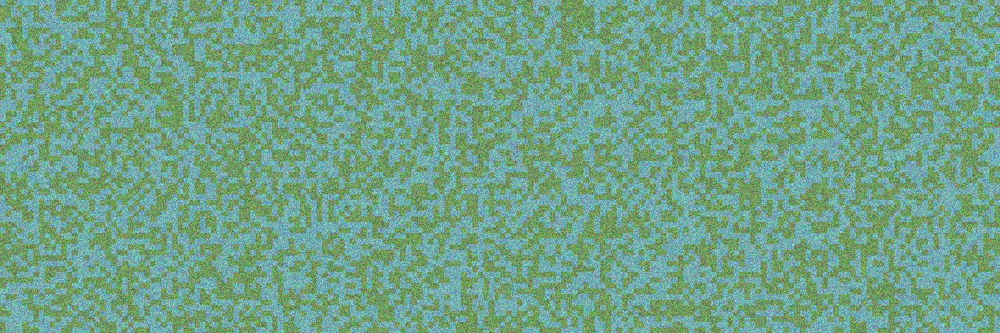

In [32]:
Image.fromarray(gt_viz)

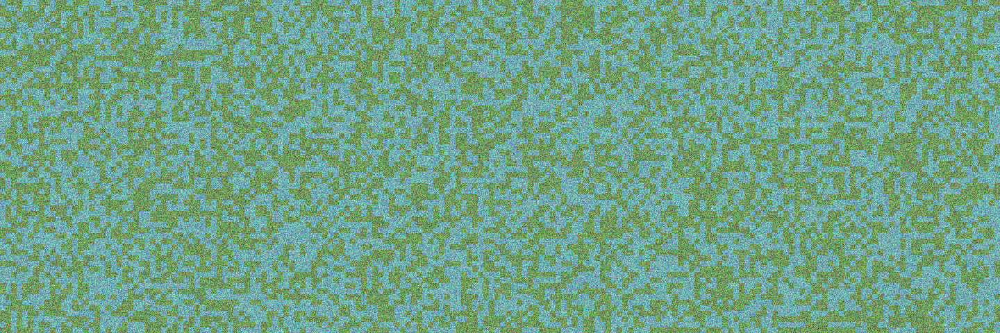

In [33]:
Image.fromarray(pred_viz)

Now run the following three cells to evaluate and visualize the entire video. You should achieve a mean IoU greater than 0.55. The saved visualization video may take some time to process in Google Drive, but you can download it to your computer and view it locally.



In [34]:
# Run on all frames
ious = []
gt_viz = []
pred_viz = []
for fi in range(len(frames)):
  if fi % 20 == 0:
    print(f"{fi} / {len(frames)}")
  X_test = davis_ds.process_frames(frames[fi:fi+1], dino_model, device)[0]
  Y_test = davis_ds.process_masks(masks[fi:fi+1], device)[0]
  Y_pred = dino_segmentation.inference(X_test)
  iou = compute_iou(Y_pred, Y_test, num_classes)
  ious.append(iou)

  gt_viz.append(davis_ds.mask_frame_overlay(Y_test, frames[fi]))
  pred_viz.append(davis_ds.mask_frame_overlay(Y_pred, frames[fi]))

gt_viz = np.stack(gt_viz)  # T x H x W x 3
pred_viz = np.stack(pred_viz)  # T x H x W x 3
final_viz = np.concatenate([gt_viz, pred_viz], -2)  # T x H x 2W x 3

0 / 99
20 / 99
40 / 99
60 / 99
80 / 99


In [35]:
print(f"Mean IoU on all frames: {sum(ious) / len(ious):.3f}")  # should be >0.55


Mean IoU on all frames: 0.341


In [36]:
def write_video_from_array(array, output_path, fps = 12):
    # For local environment, we'll save as individual images instead of video
    import os
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    
    # Save as individual frames
    for i in range(min(10, array.shape[0])):  # Save first 10 frames
        frame_path = output_path.replace('.mp4', f'_frame_{i:03d}.png')
        from PIL import Image
        Image.fromarray(array[i]).save(frame_path)
    
    print(f"Frames saved to {output_path.replace('.mp4', '_frame_*.png')}")


# Save visualization frames locally
write_video_from_array(final_viz, "results/dino_res.mp4")

Frames saved to results/dino_res_frame_*.png


**Inline Question 5** -

If you train a segmentation model on CLIP ViT's patch features, do you expect it to perform better or worse than DINO? Why should that be the case?



$\color{blue}{\textit Your Answer:}$

CLIP ViT 패치 특징으로 훈련한 세그멘테이션 모델은 **DINO보다 성능이 낮을 것**으로 예상됩니다.

**이유**:

1. **학습 목표의 차이**:
   - **DINO**: 이미지 내부의 **공간적 구조와 객체 경계**에 집중하여 학습
   - **CLIP**: 이미지-텍스트 **매칭**에 집중하여 학습

2. **특징의 특성**:
   - **DINO**: **세밀한 공간적 정보**와 **객체 경계**를 잘 포착
   - **CLIP**: **고수준 의미적 정보**는 풍부하지만 **공간적 세부사항**은 상대적으로 부족

3. **세그멘테이션 요구사항**:
   - 세그멘테이션은 **픽셀 단위의 정확한 경계**가 중요
   - DINO는 **self-supervised learning**으로 공간적 구조를 더 잘 학습
   - CLIP은 **cross-modal alignment**에 최적화되어 공간적 세부사항이 상대적으로 부족

**결론**: DINO가 세그멘테이션에 더 적합한 특징을 학습했기 때문에 더 나은 성능을 보일 것입니다.


